# 期末專題
參考 `train.py` 實現的訓練模型程式碼範例


### 安裝指定版本的keras

In [1]:
import pkg_resources
if pkg_resources.get_distribution('keras').version != '2.2.4':
    !pip install keras==2.2.4 # 安裝2.2.4版本的keras

     |████████████████████████████████| 317kB 12.0MB/s 
  Found existing installation: Keras 2.2.5
    Uninstalling Keras-2.2.5:
      Successfully uninstalled Keras-2.2.5


 ### 掛載google drive

In [2]:
from google.colab import drive

drive.mount('/content/gdrive')
# 下載基於 keras 的 yolov3 程式碼
%cd 'gdrive/My Drive'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
/content/gdrive/My Drive


### 使用keras-yolo3原作者代碼

In [3]:
# 下載
# !git clone https://github.com/qqwweee/keras-yolo3
%cd keras-yolo3

/content/gdrive/My Drive/keras-yolo3


### 載入需要的套件

In [4]:
# import cv2
import os
import xml.etree.ElementTree as ET # 載入能夠 Parser xml 文件的 library
from glob import glob
from sklearn.model_selection import train_test_split

# 在colob中使用的1.x版本的tensorflow
%tensorflow_version 1.x
import tensorflow as tf

# 將 train.py 所需要的套件載入
import keras.backend as K
import numpy as np
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers import Input, Lambda
from keras.models import Model
from keras.optimizers import Adam
from kmeans import YOLO_Kmeans
from train import get_classes, get_anchors, create_model, create_tiny_model, data_generator, data_generator_wrapper
from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

Using TensorFlow backend.


In [5]:
print(tf.__version__)

1.15.0


### 載入YOLO V3模型與權重

In [6]:
if not os.path.exists("model_data/yolo.h5"):
  print("Model doesn't exist, downloading...")
  os.system("wget https://pjreddie.com/media/files/yolov3.weights")
  print("Converting yolov3.weights to yolo.h5...")
  os.system("python convert.py yolov3.cfg yolov3.weights model_data/yolo.h5")
else:
  print("Model exist")

Model exist


In [0]:
sets_name = ['train', 'val']

def process_ids(sets, sets_name, folder, subfolder, set_, lists):
    for name in sets_name:
        set_.add((subfolder, name))

        lists[subfolder].setdefault(name, {})
        save_ids(sets[sets_name.index(name)], name, folder, subfolder, lists)

def save_ids(subset, name, folder, subfolder, lists):
#     image_list = []
    for filename in subset:            
#         img = cv2.imread(filename)

#         if img is not None:
#             image_list.append(img)
        id_ = os.path.splitext(os.path.split(filename)[1])[0]
        lists[subfolder][name].setdefault(id_, f'{folder}/{subfolder}/{id_}.jpg')

    return lists

def load_info(folder):
    classes = []
    set_ = set()
    image_ids = {}
    
    for subfolder in os.listdir(folder):
        classes.append(subfolder)
        path = os.path.join(folder, subfolder)
        train_file_paths = glob(path + '/*.jpg')
        train, val = train_test_split(train_file_paths, test_size=0.1, shuffle=True) # 把圖像分成訓練集跟驗證集，比例為9:1
        image_ids.setdefault(subfolder, {})
        process_ids([train, val], sets_name, folder, subfolder, set_, image_ids)

    return set_, classes, image_ids

以下的程式碼負責把下載下來的 Pascal VOC 資料集轉換為訓練模型時需要的格式，直接引用 https://github.com/qqwweee/keras-yolo3/blob/master/voc_annotation.py ，調整了一部分程式碼，讓我們只 sample 前 100 張圖片來做示範，在 colab 中會花一些時間跑完

In [0]:
# 把 annotation 轉換訓練時需要的資料形態
def convert_annotation(class_, image_path, list_file):
    in_file = open(f'{os.path.splitext(image_path)[0]}.xml')
    tree = ET.parse(in_file)
    root = tree.getroot()

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text

        if cls not in classes or int(difficult) == 1:
            continue
          
        cls_id = classes.index(cls)
        xmlbox = obj.find('bndbox')
        b = (int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text))
        list_file.write('|' + ','.join([str(a) for a in b]) + ',' + str(cls_id))

In [9]:
train_folder = 'xuelang_train'

set_, classes, image_ids = load_info(train_folder)

print('check annotation...')

for class_, image_set in set_:
    annotation_file = f'{class_}_{image_set}.txt'    
    print(f'check {annotation_file}')
#     os.remove(annotation_file)

    if not os.path.exists(annotation_file):
        print(f'save annotation at {annotation_file}')
        list_file = open(annotation_file, 'w')

        for image_id, image_path in image_ids[class_][image_set].items():
            list_file.write(image_path)
            convert_annotation(class_, image_path, list_file)
            list_file.write('\n')

        list_file.close()
    
print('finsh!')

check annotation...
check 吊经_val.txt
save annotation at 吊经_val.txt
check 扎洞_val.txt
save annotation at 扎洞_val.txt
check 吊经_train.txt
save annotation at 吊经_train.txt
check 毛洞_train.txt
save annotation at 毛洞_train.txt
check 油渍_train.txt
save annotation at 油渍_train.txt
check 毛洞_val.txt
save annotation at 毛洞_val.txt
check 织稀_train.txt
save annotation at 织稀_train.txt
check 跳花_train.txt
save annotation at 跳花_train.txt
check 织稀_val.txt
save annotation at 织稀_val.txt
check 扎洞_train.txt
save annotation at 扎洞_train.txt
check 毛斑_train.txt
save annotation at 毛斑_train.txt
check 缺经_val.txt
save annotation at 缺经_val.txt
check 油渍_val.txt
save annotation at 油渍_val.txt
check 擦洞_val.txt
save annotation at 擦洞_val.txt
check 污渍_val.txt
save annotation at 污渍_val.txt
check 擦洞_train.txt
save annotation at 擦洞_train.txt
check 跳花_val.txt
save annotation at 跳花_val.txt
check 缺经_train.txt
save annotation at 缺经_train.txt
check 毛斑_val.txt
save annotation at 毛斑_val.txt
check 污渍_train.txt
save annotation at 污渍_train.txt


In [10]:
classes_path = 'model_data/xuelang_class.txt'

print(f'check {classes_path}')
os.remove(classes_path)

if not os.path.exists(classes_path):
    print(f'save classes at {classes_path}')
    list_file = open(classes_path, 'w')
    
    for class_ in classes:
        list_file.write(class_ + '\n')

    list_file.close()
    
print('finsh!')

check model_data/xuelang_class.txt
save classes at model_data/xuelang_class.txt
finsh!


In [11]:
annotation_path = [] # 轉換好格式的標註檔案

print('check annotation_path...')

for name in sets_name:
    output = f'xuelang_{name}.txt'    
    annotation_path.append(output)
    print(f'check {output}')
    os.remove(output)
    
    if not os.path.exists(output):
        print(f'concatenate sets files at {output}')

        with open(output, 'w') as outfile:
            for class_ in classes:
                annotation_file = f'{class_}_{name}.txt'

                with open(annotation_file) as infile:
                    for line in infile:
                        outfile.write(line)

print('finsh!')

check annotation_path...
check xuelang_train.txt
concatenate sets files at xuelang_train.txt
check xuelang_val.txt
concatenate sets files at xuelang_val.txt
finsh!


In [12]:
anchors_path = 'model_data/xuelang_anchors.txt'
kmeans = YOLO_Kmeans(9, annotation_path[0], anchors_path)
kmeans.txt2clusters()

K anchors:
 [[  51   60]
 [  73  685]
 [  88   92]
 [  96 1814]
 [  97  220]
 [ 137  118]
 [ 225  195]
 [ 512  588]
 [1223   98]]
Accuracy: 65.41%


把 YOLO weights 轉換為能夠提供給 keras 作為訓練新模型的初始權重，注意這部分多了一個 `-w` 的參數，可以參考 https://github.com/qqwweee/keras-yolo3/blob/master/convert.py#L242 以及 https://stackoverflow.com/questions/42621864/difference-between-keras-model-save-and-model-save-weights 理解其中差別

In [13]:
if not os.path.exists("model_data/yolo_weights.h5"):
  print("Converting pretrained YOLOv3 weights for training")
  os.system("python convert.py -w yolov3.cfg yolov3.weights model_data/yolo_weights.h5") 
else:
  print("Pretrained weights exists")

Pretrained weights exists


In [17]:
log_dir = 'logs/000/' # 訓練好的模型儲存的路徑
class_names = get_classes(classes_path)
num_classes = len(class_names)
anchors = get_anchors(anchors_path)
input_shape = (416,416) # multiple of 32, hw
is_tiny_version = len(anchors)==6 # default setting

if is_tiny_version:
    model = create_tiny_model(input_shape, anchors, num_classes,
                              freeze_body=2, weights_path='model_data/tiny_yolo_weights.h5')
else:
    model = create_model(input_shape, anchors, num_classes,
                         freeze_body=2, weights_path='model_data/yolo_weights.h5') # make sure you know what you freeze

logging = TensorBoard(log_dir=log_dir)
checkpoint = ModelCheckpoint(log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
                             monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

num = {}
lines = {}

for annotation in annotation_path:
    num.setdefault(annotation, [])
    lines.setdefault(annotation, [])
    with open(annotation) as f:
        lines[sets_name[annotation_path.index(annotation)]] = f.readlines()
    num[sets_name[annotation_path.index(annotation)]] = len(lines[sets_name[annotation_path.index(annotation)]])

# Train with frozen layers first, to get a stable loss.
# Adjust num epochs to your dataset. This step is enough to obtain a not bad model.
# 一開始先 freeze YOLO 除了 output layer 以外的 darknet53 backbone 來 train
if True:
    model.compile(optimizer=Adam(lr=1e-3), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = 16
    print(f"Train on {str(num['train'])} samples, val on {str(num['val'])} samples, with batch size {str(batch_size)}.")
    # 模型利用 generator 產生的資料做訓練，強烈建議大家去閱讀及理解 data_generator_wrapper 在 train.py 中的實現
    model.fit_generator(data_generator_wrapper(lines['train'], batch_size, input_shape, anchors, num_classes),
                        steps_per_epoch=max(1, num['train']//batch_size),
                        validation_data=data_generator_wrapper(lines['val'], batch_size, input_shape, anchors, num_classes),
                        validation_steps=max(1, num['val']//batch_size),
                        epochs=50,
                        initial_epoch=0,
                        callbacks=[logging, checkpoint])
    model.save_weights(log_dir + 'trained_weights_stage_1.h5')

# Unfreeze and continue training, to fine-tune.
# Train longer if the result is not good.
if True:
    # 把所有 layer 都改為 trainable
    for i in range(len(model.layers)):
        model.layers[i].trainable = True
    model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
    print('Unfreeze all of the layers.')

    batch_size = 16 # note that more GPU memory is required after unfreezing the body
    print(f"Train on {str(num['train'])} samples, val on {str(num['val'])} samples, with batch size {str(batch_size)}.")
    model.fit_generator(data_generator_wrapper(lines['train'], batch_size, input_shape, anchors, num_classes),
                        steps_per_epoch=max(1, num['train']//batch_size),
                        validation_data=data_generator_wrapper(lines['val'], batch_size, input_shape, anchors, num_classes),
                        validation_steps=max(1, num['val']//batch_size),
                        epochs=100,
                        initial_epoch=50,
                        callbacks=[logging, checkpoint, reduce_lr, early_stopping])
    model.save_weights(log_dir + 'trained_weights_final.h5')

Create YOLOv3 model with 9 anchors and 10 classes.


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((1, 1, 1024, 45) vs (255, 1024, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((45,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((1, 1, 512, 45) vs (255, 512, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((45,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_75 due to mismatch in shape ((1,

Load weights model_data/yolo_weights.h5.
Freeze the first 249 layers of total 252 layers.
Train on 510 samples, val on 63 samples, with batch size 16.
Epoch 1/50
31/31 [==============================] - 429s 14s/step - loss: 2231.0856 - val_loss: 357.7331
Epoch 2/50
31/31 [==============================] - 102s 3s/step - loss: 260.3998 - val_loss: 152.4814
Epoch 3/50
31/31 [==============================] - 99s 3s/step - loss: 148.2595 - val_loss: 100.1487
Epoch 4/50
31/31 [==============================] - 66s 2s/step - loss: 112.1033 - val_loss: 74.1832
Epoch 5/50
31/31 [==============================] - 100s 3s/step - loss: 90.9571 - val_loss: 64.5338
Epoch 6/50
31/31 [==============================] - 99s 3s/step - loss: 74.5206 - val_loss: 55.5100
Epoch 7/50
31/31 [==============================] - 100s 3s/step - loss: 66.8703 - val_loss: 51.2004
Epoch 8/50
31/31 [==============================] - 100s 3s/step - loss: 60.4870 - val_loss: 47.9068
Epoch 9/50
31/31 [=================

ResourceExhaustedError: ignored

In [21]:
if True:
    # 把所有 layer 都改為 trainable
    for i in range(len(model.layers)):
        model.layers[i].trainable = True
    model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
    print('Unfreeze all of the layers.')

    batch_size = 4 # note that more GPU memory is required after unfreezing the body
    print(f"Train on {str(num['train'])} samples, val on {str(num['val'])} samples, with batch size {str(batch_size)}.")
    model.fit_generator(data_generator_wrapper(lines['train'], batch_size, input_shape, anchors, num_classes),
                        steps_per_epoch=max(1, num['train']//batch_size),
                        validation_data=data_generator_wrapper(lines['val'], batch_size, input_shape, anchors, num_classes),
                        validation_steps=max(1, num['val']//batch_size),
                        epochs=100,
                        initial_epoch=50,
                        callbacks=[logging, checkpoint, reduce_lr, early_stopping])
    model.save_weights(log_dir + 'trained_weights_final.h5')

Unfreeze all of the layers.
Train on 510 samples, val on 63 samples, with batch size 4.
Epoch 51/100
127/127 [==============================] - 134s 1s/step - loss: 25.4342 - val_loss: 25.4706
Epoch 52/100
127/127 [==============================] - 119s 934ms/step - loss: 24.9783 - val_loss: 25.5365
Epoch 53/100
127/127 [==============================] - 124s 979ms/step - loss: 24.1042 - val_loss: 23.2928
Epoch 54/100
127/127 [==============================] - 125s 985ms/step - loss: 23.7909 - val_loss: 24.2058
Epoch 55/100
127/127 [==============================] - 126s 989ms/step - loss: 23.2014 - val_loss: 21.5643
Epoch 56/100
127/127 [==============================] - 125s 986ms/step - loss: 23.0410 - val_loss: 22.2207
Epoch 57/100
127/127 [==============================] - 125s 982ms/step - loss: 23.1949 - val_loss: 22.4731
Epoch 58/100
127/127 [==============================] - 122s 957ms/step - loss: 23.0088 - val_loss: 22.4622

Epoch 00058: ReduceLROnPlateau reducing learning r

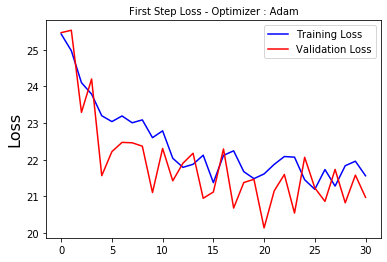

In [24]:
train1_loss = model.history.history["loss"]
valid1_loss = model.history.history["val_loss"]

import matplotlib.pyplot as plt
%matplotlib inline

plt.title('First Step Loss - Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(range(len(train1_loss)), train1_loss, color='b', label='Training Loss')
plt.plot(range(len(valid1_loss)), valid1_loss, color='r', label='Validation Loss')
plt.legend()
plt.show()

In [0]:
from PIL import Image

test_folder = 'xuelang_test'
test_file_paths = glob(test_folder + '/*.jpg')
images = []

for detect_file in test_file_paths[:50]:
    images.append(Image.open(detect_file))

In [29]:
from yolo import YOLO
r_images = []
yolo_model = YOLO(model_path=log_dir + 'trained_weights_final.h5', classes_path=classes_path)
for image in images:
  r_images.append(yolo_model.detect_image(image))

logs/000/trained_weights_final.h5 model, anchors, and classes loaded.
(416, 416, 3)
Found 0 boxes for img
4.976425451999603
(416, 416, 3)
Found 0 boxes for img
0.18593306500042672
(416, 416, 3)
Found 0 boxes for img
0.17415516499931982
(416, 416, 3)
Found 0 boxes for img
0.1828938909984572
(416, 416, 3)
Found 0 boxes for img
0.17905523399895173
(416, 416, 3)
Found 0 boxes for img
0.18673718299942266
(416, 416, 3)
Found 0 boxes for img
0.17979868099973828
(416, 416, 3)
Found 0 boxes for img
0.1819172110008367
(416, 416, 3)
Found 0 boxes for img
0.18079078600021603
(416, 416, 3)
Found 1 boxes for img
擦洞 0.57 (1300, 174) (1314, 198)
0.18372330099919054
(416, 416, 3)
Found 2 boxes for img
擦洞 0.31 (2203, 836) (2212, 852)
擦洞 0.33 (2213, 830) (2225, 856)
0.18461363099959271
(416, 416, 3)
Found 0 boxes for img
0.19048701899919251
(416, 416, 3)
Found 0 boxes for img
0.1877798139994411
(416, 416, 3)
Found 0 boxes for img
0.18767452300016885
(416, 416, 3)
Found 0 boxes for img
0.19375966099869402

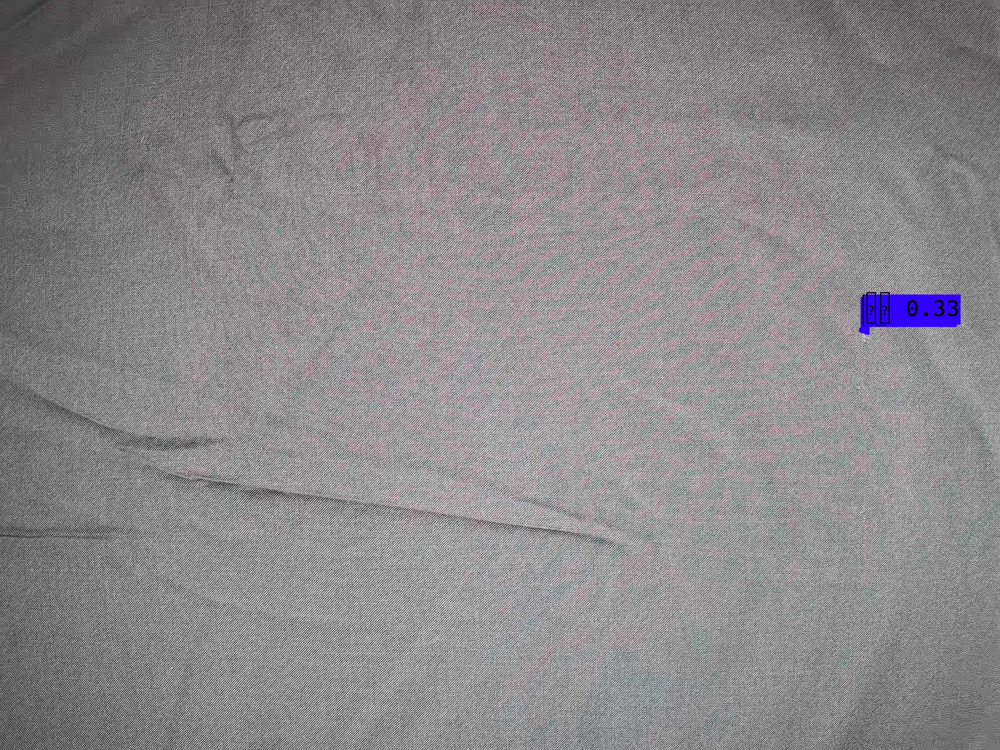

In [31]:
r_images[10]

In [0]:
# with open("2007_train.txt", "r") as f:
#   d = f.readlines()
# d